In [85]:
import keras
from keras import layers
from keras import ops
from keras.utils import load_img
from keras.utils import array_to_img
from keras.utils import img_to_array
from keras.preprocessing import image_dataset_from_directory
import tensorflow as tf  #  only for data preprocessing

import os
import math
import numpy as np
import zipfile

from IPython.display import display

Load dataset

In [35]:
dataset_url = "http://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
# root_dir = os.path.join(data_dir, "BSDS500/data")
!ls -haliF /root/.keras/datasets

70763455/70763455 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
total 68M
398077 drwxr-xr-x 3 root root 4.0K Dec 22 18:23 ./
395283 drwxr-xr-x 3 root root 4.0K Dec 22 16:35 ../
398078 drwxrwxr-x 5 1000 1000 4.0K Jan 22  2013 BSR/
398075 -rw-r--r-- 1 root root  68M Dec 22 18:23 BSR.tar.gz


extract files

In [86]:

# extract_path = os.path.splitext(data_dir)[0]

# if not os.path.exists(extract_path):
#     with zipfile.ZipFile(data_dir, 'r') as zip_ref:
#         zip_ref.extractall(extract_path)

# !ls -haliF /root/.keras/datasets/DIV2K_train_HR/DIV2K_train_HR
# print(extract_path)
# root_dir = os.path.join(extract_path, "DIV2K_train_HR")
# root_dir = os.path.join(data_dir, "BSDS500/data")
root_dir = os.path.join(data_dir, "BSDS500/data")
train_dir = os.path.join(root_dir, "images", "train")
print(train_dir)
!ls -haliF /root/.keras/datasets/BSR/BSDS500/data/images


/root/.keras/datasets/BSR/BSDS500/data/images/train
total 20K
398696 drwxr-xr-x 5 1000 1000 4.0K Jan 22  2013 ./
398191 drwxr-xr-x 4 1000 1000 4.0K Jan 22  2013 ../
399003 drwxr-xr-x 2 1000 1000 4.0K Jan 22  2013 test/
398697 drwxr-xr-x 2 1000 1000 4.0K Jan 22  2013 train/
398901 drwxr-xr-x 2 1000 1000 4.0K Jan 22  2013 val/


Create training and validating datasets

In [87]:



crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    train_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    train_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 200 files.
Using 160 files for training.
Found 200 files.
Using 40 files for validation.


Move images from [0-255] diapasone to [0-1]

In [88]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

See some image samples

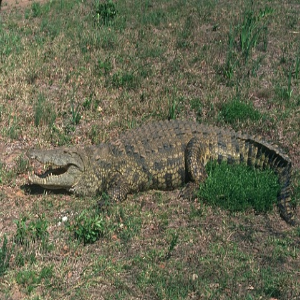

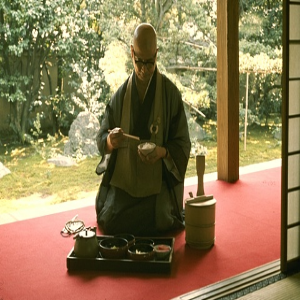

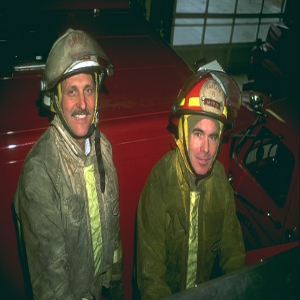

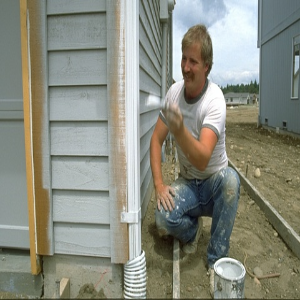

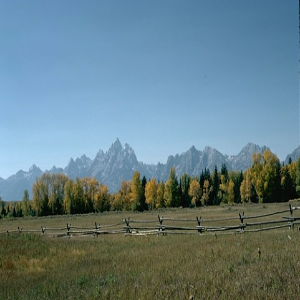

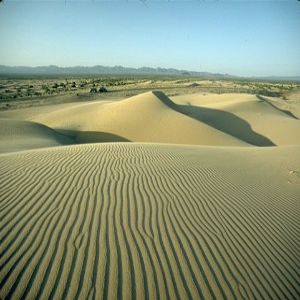

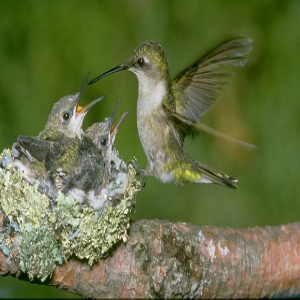

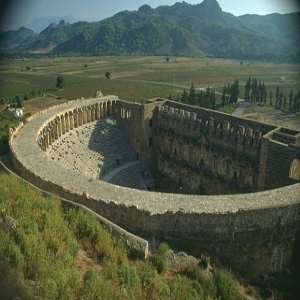

In [89]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

prepare a dataset of test image paths

In [91]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")
# print(dataset)
# !ls -haliF /root/.keras/datasets/BSR/BSDS500/data/images/test


test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

# print(test_img_paths)

Crop and resize images

In [92]:
# Use TF Ops to process.
def process_input(input_image, input_size, upscale_factor):
    input_image = tf.image.rgb_to_yuv(input_image)
    last_dimension_axis = len(input_image.shape) - 1
    y, u, v = tf.split(input_image, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input_image):
    input_image = tf.image.rgb_to_yuv(input_image)
    last_dimension_axis = len(input_image.shape) - 1
    y, u, v = tf.split(input_image, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

 look at the input and target data.

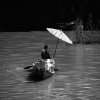

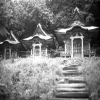

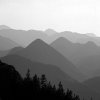

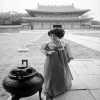

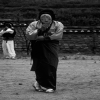

...

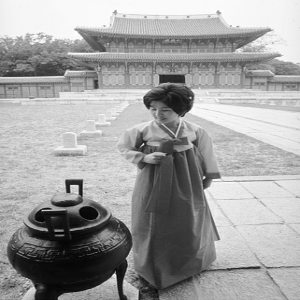

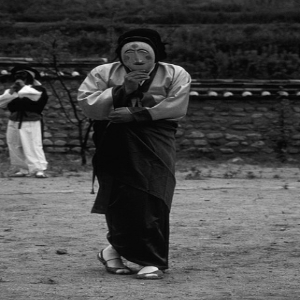

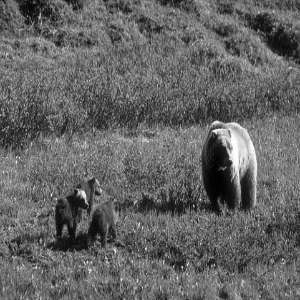

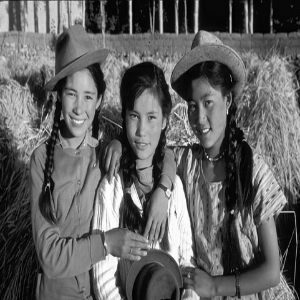

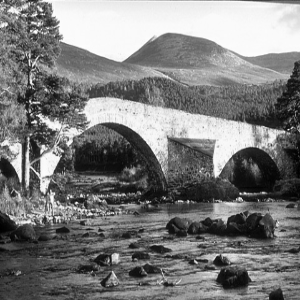

In [93]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

Build a model

In [94]:
class DepthToSpace(layers.Layer):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size

    def call(self, input):
        batch, height, width, depth = ops.shape(input)
        depth = depth // (self.block_size**2)

        x = ops.reshape(
            input, [batch, height, width, self.block_size, self.block_size, depth]
        )
        x = ops.transpose(x, [0, 1, 3, 2, 4, 5])
        x = ops.reshape(
            x, [batch, height * self.block_size, width * self.block_size, depth]
        )
        return x


def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor**2), 3, **conv_args)(x)
    outputs = DepthToSpace(upscale_factor)(x)

    return keras.Model(inputs, outputs)

Define utility functions

In [95]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

Define callbacks to monitor training

In [96]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

Define ModelCheckpoint and EarlyStopping callbacks.

In [97]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint.keras"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, None, None, 1)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, None, None, 64)      │           1,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, None, None, 32)      │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, None, None, 9)       │           2,601 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ depth_to_space_1 (DepthToSpace)      │ (None, None, None, 1)       │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 59,657 (233.04 KB)

 Trainable params: 59,657 (233.04 KB)

 Non-trainable params: 0 (0.00 B)

Train the model

Epoch 1/100
Mean PSNR for epoch: 18.78
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


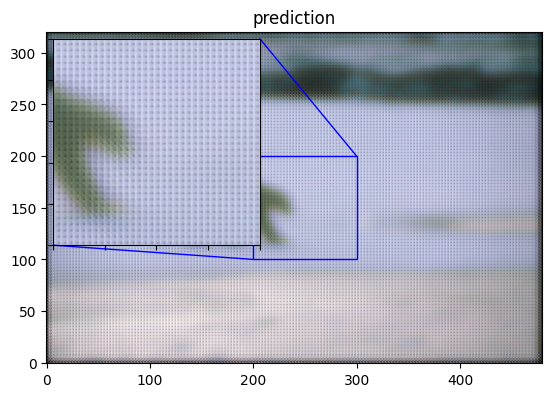

20/20 - 23s - 1s/step - loss: 0.0592 - val_loss: 0.0128
Epoch 2/100
Mean PSNR for epoch: 20.83
20/20 - 19s - 926ms/step - loss: 0.0091 - val_loss: 0.0077
Epoch 3/100
Mean PSNR for epoch: 22.37
20/20 - 23s - 1s/step - loss: 0.0060 - val_loss: 0.0058
Epoch 4/100
Mean PSNR for epoch: 23.26
20/20 - 38s - 2s/step - loss: 0.0047 - val_loss: 0.0046
Epoch 5/100
Mean PSNR for epoch: 24.33
20/20 - 18s - 922ms/step - loss: 0.0039 - val_loss: 0.0039
Epoch 6/100
Mean PSNR for epoch: 24.06
20/20 - 22s - 1s/step - loss: 0.0034 - val_loss: 0.0036
Epoch 7/100
Mean PSNR for epoch: 23.97
20/20 - 19s - 942ms/step - loss: 0.0032 - val_loss: 0.0033
Epoch 8/100
Mean PSNR for epoch: 25.13
20/20 - 21s - 1s/step - loss: 0.0030 - val_loss: 0.0032
Epoch 9/100
Mean PSNR for epoch: 24.87
20/20 - 20s - 979ms/step - loss: 0.0031 - val_loss: 0.0031
Epoch 10/100
Mean PSNR for epoch: 25.15
20/20 - 20s - 983ms/step - loss: 0.0031 - val_loss: 0.0031
Epoch 11/100
Mean PSNR for epoch: 25.07
20/20 - 21s - 1s/step - loss: 0.0

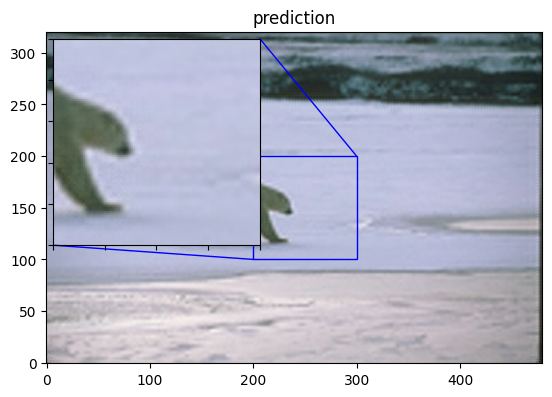

20/20 - 19s - 933ms/step - loss: 0.0027 - val_loss: 0.0028
Epoch 22/100
Mean PSNR for epoch: 25.33
20/20 - 22s - 1s/step - loss: 0.0026 - val_loss: 0.0028
Epoch 23/100
Mean PSNR for epoch: 25.88
20/20 - 19s - 946ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 24/100
Mean PSNR for epoch: 26.38
20/20 - 19s - 934ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 25/100
Mean PSNR for epoch: 26.15
20/20 - 20s - 985ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 26/100
Mean PSNR for epoch: 25.11
20/20 - 18s - 906ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 27/100
Mean PSNR for epoch: 26.17
20/20 - 22s - 1s/step - loss: 0.0026 - val_loss: 0.0027
Epoch 28/100
Mean PSNR for epoch: 25.29
20/20 - 19s - 943ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 29/100
Mean PSNR for epoch: 26.24
20/20 - 18s - 913ms/step - loss: 0.0027 - val_loss: 0.0028
Epoch 30/100
Mean PSNR for epoch: 25.48
20/20 - 19s - 975ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 31/100
Mean PSNR for epoch: 25.00
20/20 - 18s - 89

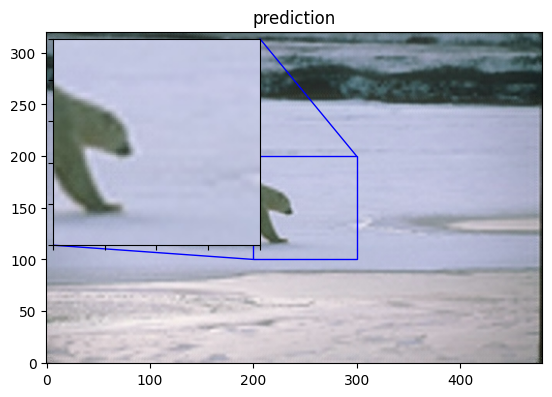

20/20 - 21s - 1s/step - loss: 0.0025 - val_loss: 0.0027
Epoch 42/100
Mean PSNR for epoch: 25.20
20/20 - 20s - 984ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 43/100
Mean PSNR for epoch: 25.54
20/20 - 20s - 999ms/step - loss: 0.0027 - val_loss: 0.0030
Epoch 44/100
Mean PSNR for epoch: 25.38
20/20 - 17s - 874ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 45/100
Mean PSNR for epoch: 26.28
20/20 - 18s - 923ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 46/100
Mean PSNR for epoch: 25.65
20/20 - 19s - 964ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 47/100
Mean PSNR for epoch: 25.64
20/20 - 22s - 1s/step - loss: 0.0025 - val_loss: 0.0027
Epoch 48/100
Mean PSNR for epoch: 24.94
20/20 - 18s - 898ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 49/100
Mean PSNR for epoch: 25.53
20/20 - 17s - 865ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 50/100
Mean PSNR for epoch: 25.15
20/20 - 18s - 881ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 51/100
Mean PSNR for epoch: 26.02
20/20 - 19s - 94

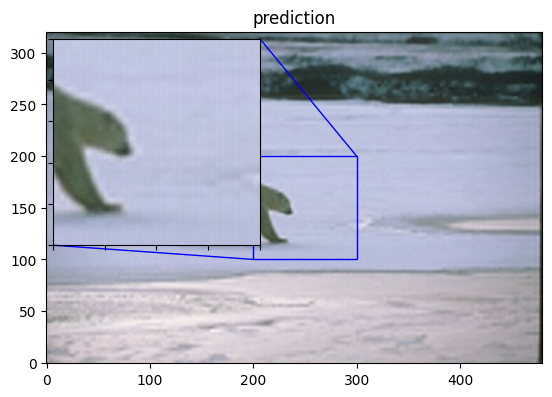

20/20 - 22s - 1s/step - loss: 0.0025 - val_loss: 0.0026
Epoch 62/100
Mean PSNR for epoch: 25.36
20/20 - 19s - 944ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 63/100
Mean PSNR for epoch: 26.12
20/20 - 18s - 914ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 64/100
Mean PSNR for epoch: 26.01
20/20 - 20s - 983ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 65/100
Mean PSNR for epoch: 25.32
20/20 - 21s - 1s/step - loss: 0.0025 - val_loss: 0.0027
Epoch 66/100
Mean PSNR for epoch: 26.19
20/20 - 18s - 898ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 67/100
Mean PSNR for epoch: 25.52
20/20 - 17s - 871ms/step - loss: 0.0027 - val_loss: 0.0029
Epoch 68/100
Mean PSNR for epoch: 24.85
20/20 - 17s - 871ms/step - loss: 0.0031 - val_loss: 0.0036
Epoch 69/100
Mean PSNR for epoch: 25.16
20/20 - 20s - 1s/step - loss: 0.0029 - val_loss: 0.0030
Epoch 70/100
Mean PSNR for epoch: 24.96
20/20 - 22s - 1s/step - loss: 0.0026 - val_loss: 0.0027
Epoch 71/100
Mean PSNR for epoch: 25.30
20/20 - 18s - 904ms/st

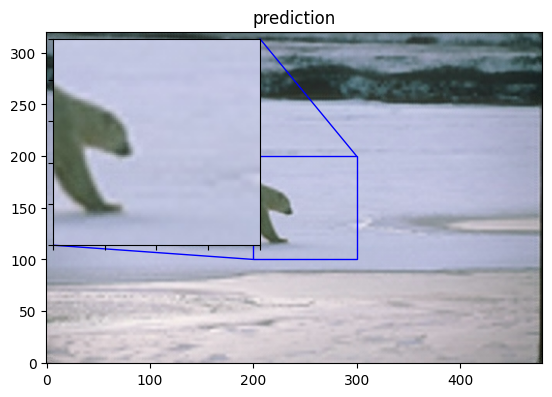

20/20 - 20s - 975ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 82/100
Mean PSNR for epoch: 25.31
20/20 - 17s - 871ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 83/100
Mean PSNR for epoch: 26.34
20/20 - 19s - 951ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 84/100
Mean PSNR for epoch: 25.72
20/20 - 17s - 869ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 85/100
Mean PSNR for epoch: 25.68
20/20 - 21s - 1s/step - loss: 0.0024 - val_loss: 0.0026
Epoch 86/100
Mean PSNR for epoch: 25.56
20/20 - 20s - 981ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 87/100
Mean PSNR for epoch: 26.87
20/20 - 18s - 880ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 88/100
Mean PSNR for epoch: 25.42
20/20 - 22s - 1s/step - loss: 0.0024 - val_loss: 0.0026
Epoch 89/100
Mean PSNR for epoch: 26.41
20/20 - 19s - 958ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 90/100
Mean PSNR for epoch: 25.66
20/20 - 22s - 1s/step - loss: 0.0024 - val_loss: 0.0026
Epoch 91/100
Mean PSNR for epoch: 26.01
20/20 - 19s - 947ms

In [98]:
epochs = 100

model.compile(
    optimizer=optimizer,
    loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

In [99]:
!ls -haliF /tmp | grep checkpoint

 399238 -rw-r--r-- 1 root root 730K Dec 22 21:53 checkpoint.keras


Run model prediction and plot the results

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 30.4551


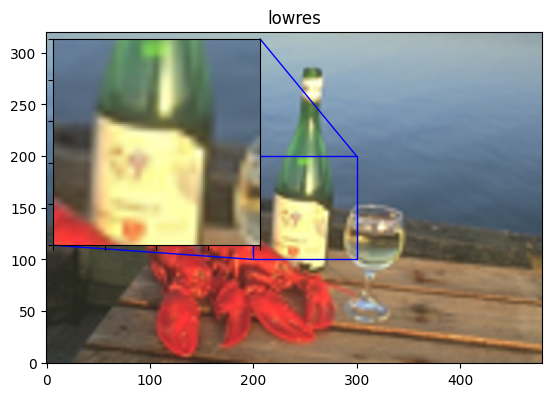

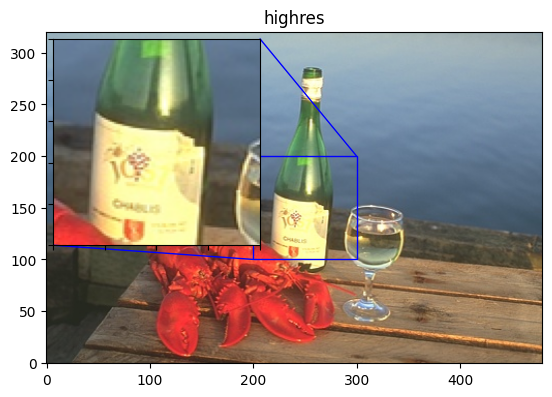

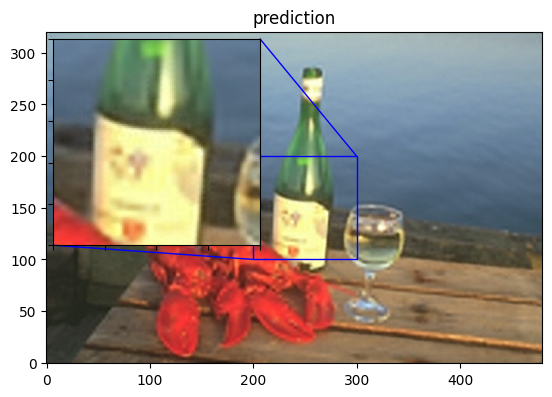

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 25.8786


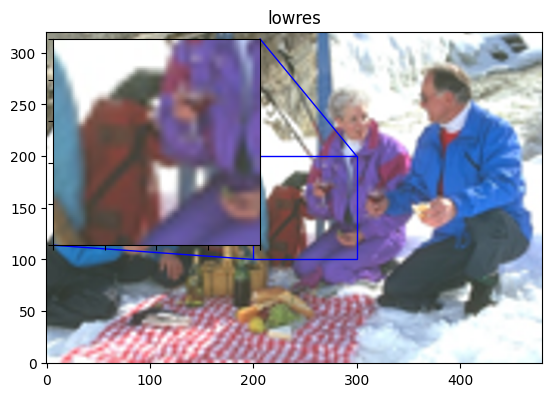

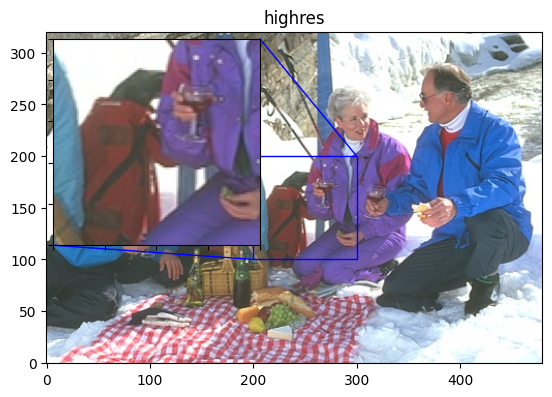

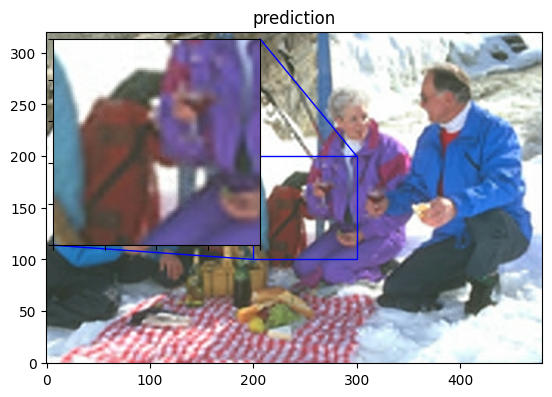

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 28.1954


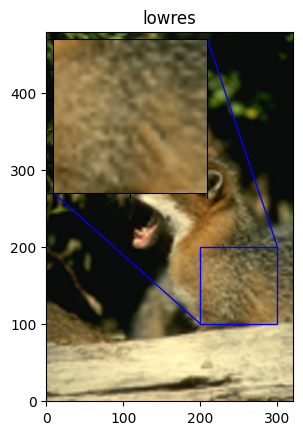

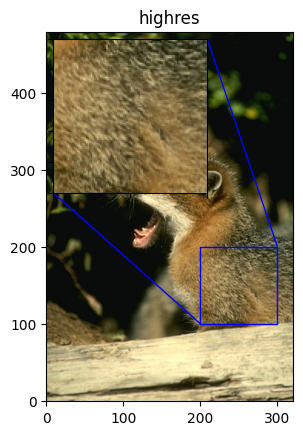

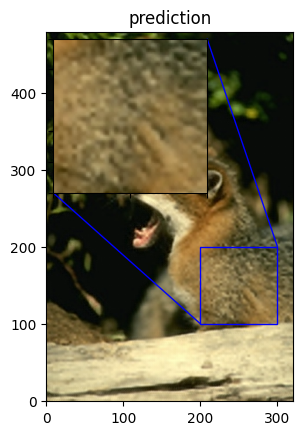

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 28.2240


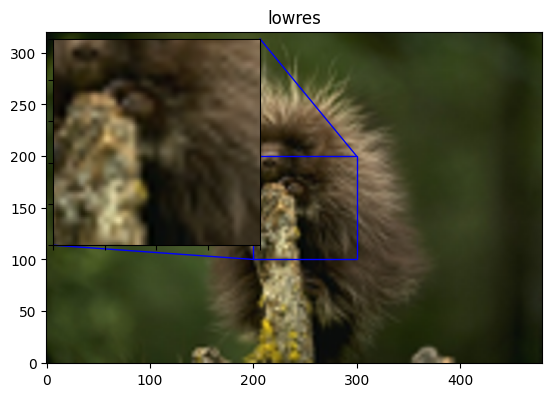

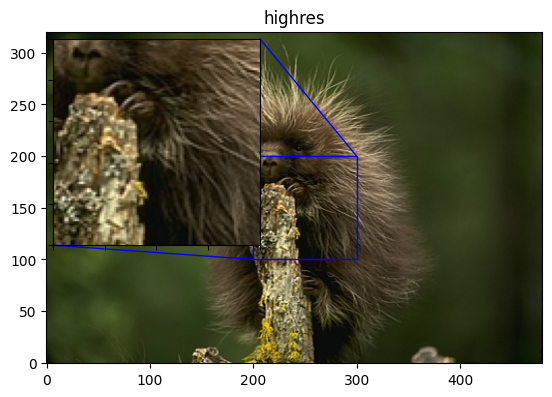

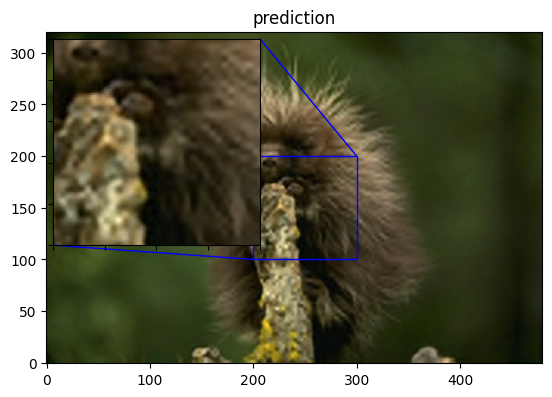

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 26.2417


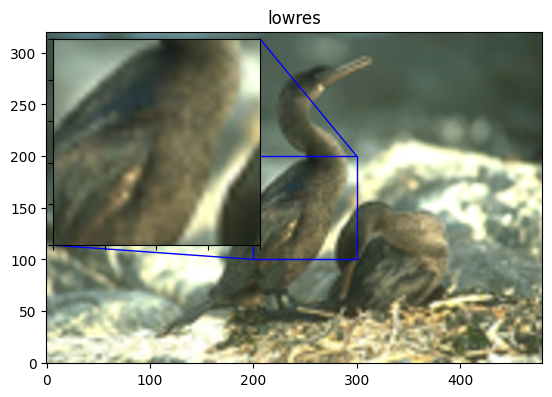

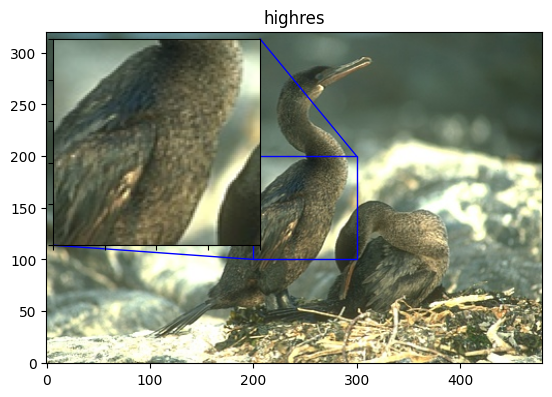

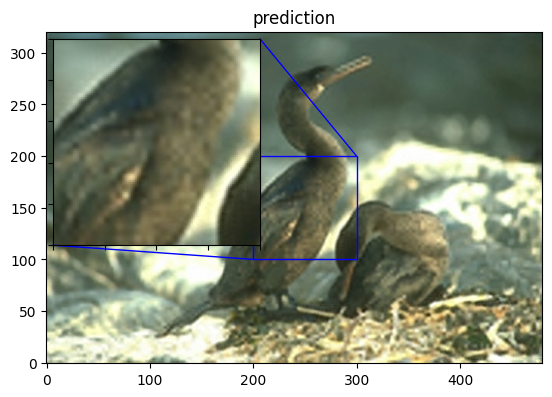

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 26.5325


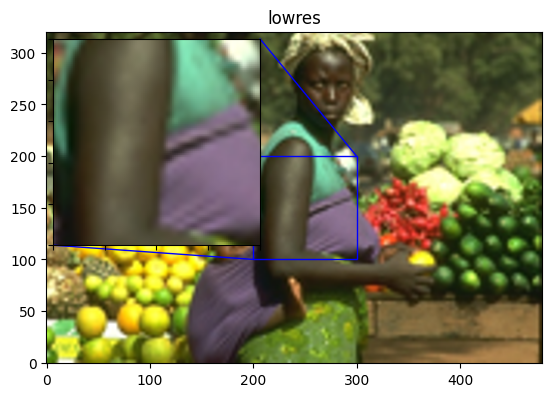

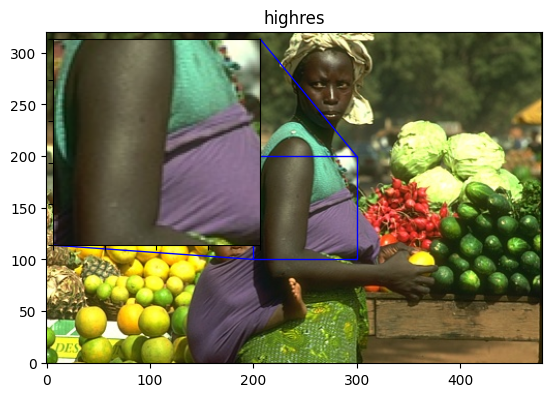

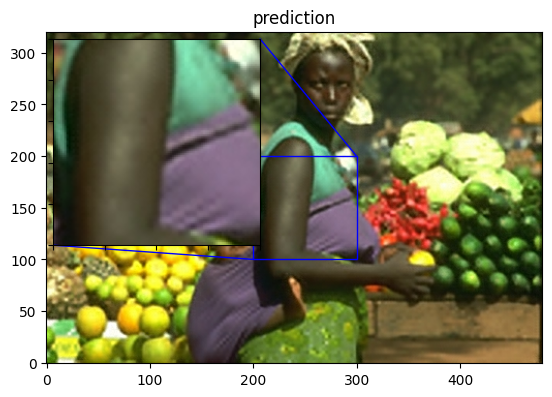

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 26.9613


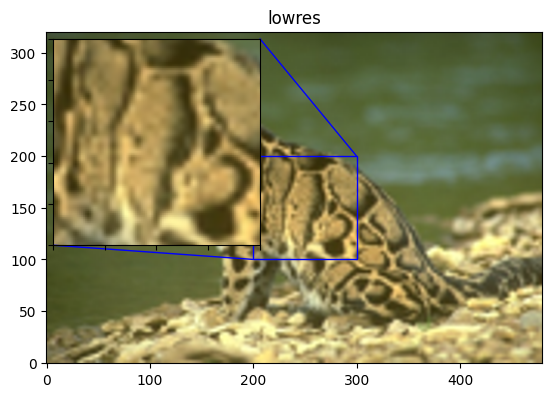

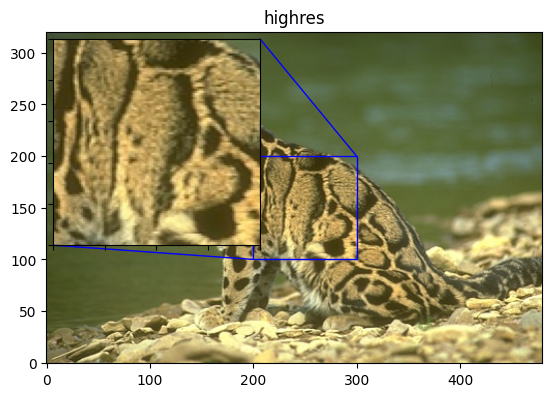

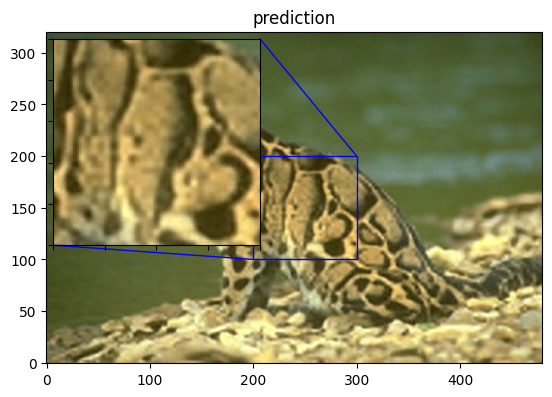

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 24.3335


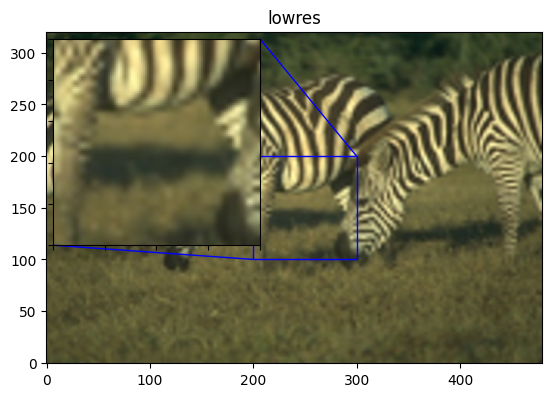

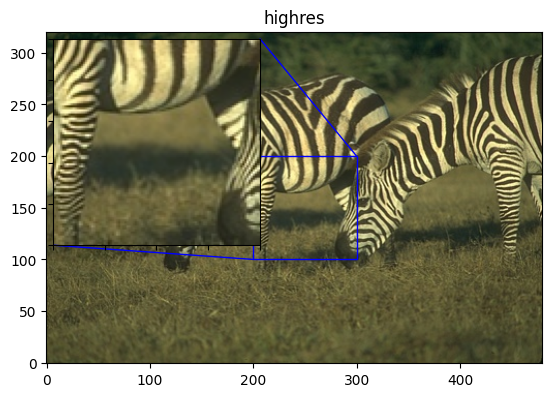

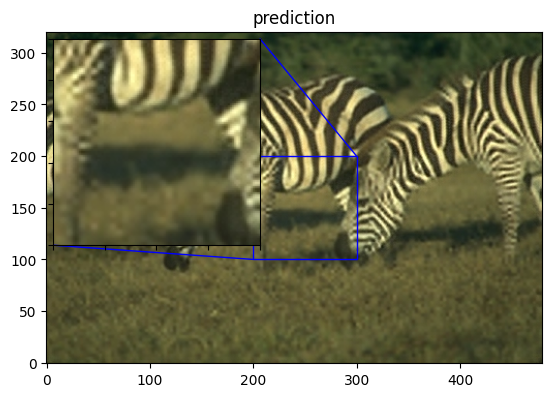

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 30.0192


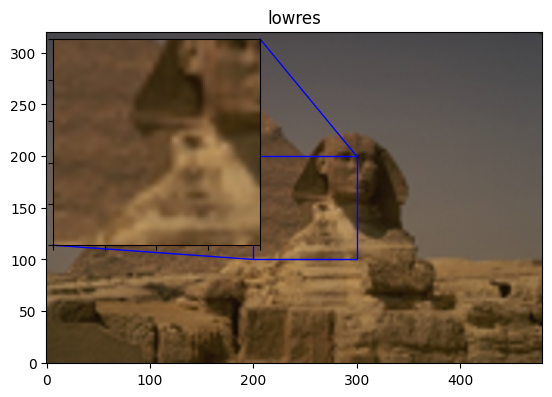

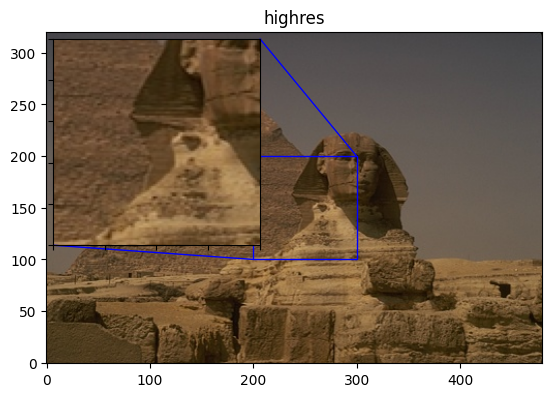

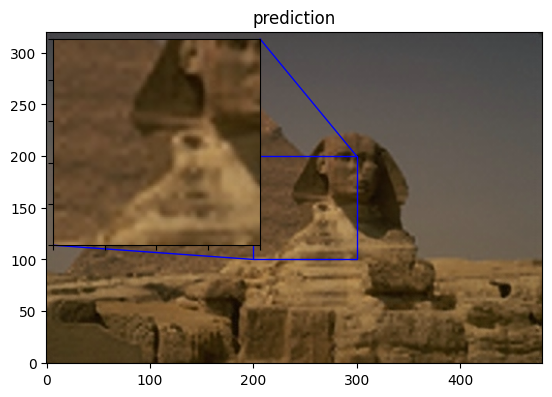

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 25.6855


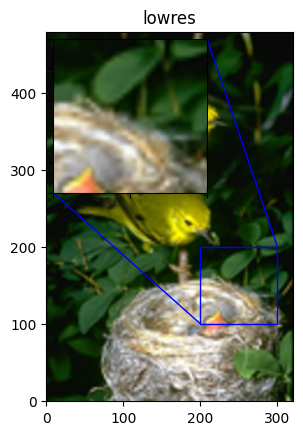

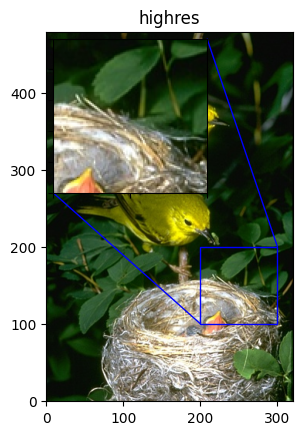

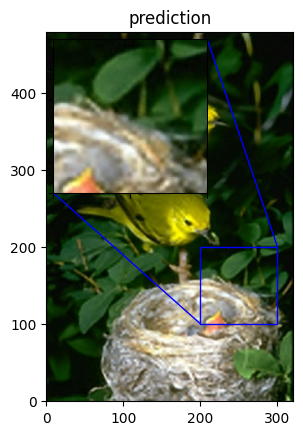

Avg. PSNR of lowres images is 26.7357
Avg. PSNR of reconstructions is 27.2527


In [100]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))